<a href="https://colab.research.google.com/github/probml/probml-notebooks/blob/main/vdvae_flax_demo_cifar.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Very Deep VAEs for CIFAR-10

This notebook shows demo working with vdvae in flax and the code used is from [google_research/vdvae_flax](https://github.com/google-research/google-research/tree/master/vdvae_flax).
The model is pre-trained on TPU VMs for several days.
This colab loads the checkpoint and uses the pre-trained model for sampling and image reconstruction.

Written by Ruiqi Gao.


## Setup

In [1]:
%%capture

# https://github.com/google-research/google-research/blob/master/vdvae_flax/requirements.txt

!pip install absl-py
!pip install chex
!pip install clu
!pip install distrax
!pip install flax
# jax==0.2.9
# jaxlib==0.1.60
!pip install ml_collections
# numpy
!pip install optax
# tensorflow-cpu
# tensorflow-datasets

In [2]:
# Download Cifar-10 dataset

import tensorflow_datasets as tfds

dataset = tfds.load("cifar10", download=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/cifar10/3.0.2.incompleteFE8WWW/cifar10-train.tfrecord


  0%|          | 0/50000 [00:00<?, ? examples/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/cifar10/3.0.2.incompleteFE8WWW/cifar10-test.tfrecord


  0%|          | 0/10000 [00:00<?, ? examples/s]

Dataset cifar10 downloaded and prepared to /root/tensorflow_datasets/cifar10/3.0.2. Subsequent calls will reuse this data.


In [3]:
import os

try:
    os.environ["COLAB_TPU_ADDR"]
    import jax.tools.colab_tpu

    jax.tools.colab_tpu.setup_tpu()
except:
    pass

In [4]:
import jax

print(jax.device_count())

8


## Download checkpoints and code

In [1]:
from google.colab import auth

auth.authenticate_user()

In [2]:
project_id = "probml"
!gcloud config set project {project_id}

Updated property [core/project].


In [3]:
# Download checkpoints
!gsutil cp -r gs://probml_data/vdvae_checkpoints /content/

Copying gs://probml_data/vdvae_checkpoints/ckpt-201.data-00000-of-00001...
Copying gs://probml_data/vdvae_checkpoints/ckpt-201.flax...
Copying gs://probml_data/vdvae_checkpoints/ckpt-201.index...
| [3 files][589.5 MiB/589.5 MiB]                                                
Operation completed over 3 objects/589.5 MiB.                                    


In [4]:
checkpoint_path = "/content/vdvae_checkpoints"

In [5]:
# Download code
!git clone -q https://github.com/google-research/google-research.git

In [6]:
%cd /content/google-research

/content/google-research


## Model


##### Setup the hyperparameters:

In [7]:
from vdvae_flax.configs import default

config = default.get_config()
config.evaluation.batch_size = 16
print(config)

data: {task: cifar10}
decoder:
  bottlenecked_num_channels: 96
  latent_dim: 16
  num_blocks: 43
  num_channels: 384
  output_image_resolution: 32
  precision: highest
  upsampling_rates:
  - !!python/tuple [1, 4]
  - !!python/tuple [4, 2]
  - !!python/tuple [10, 2]
  - !!python/tuple [21, 2]
encoder:
  bottlenecked_num_channels: 96
  downsampling_rates:
  - !!python/tuple [11, 2]
  - !!python/tuple [18, 2]
  - !!python/tuple [25, 2]
  - !!python/tuple [29, 4]
  num_blocks: 33
  num_channels: 384
  precision: highest
evaluation: {batch_size: 16, ema_rate: 0.9996, subset: test}
exp_name: experiment
logs: {checkpoint_every_steps: 5000, eval_full_every_steps: 5000, log_loss_every_steps: 500}
model_name: vdvae
optimizer:
  args: {b1: 0.9, b2: 0.9, eps: 1.0e-08, weight_decay: 0.01}
  base_learning_rate: 0.0003
  gradient_clip_norm: 250.0
  gradient_skip_norm: 500.0
  name: adamw
sampler: {high: 255, low: 0, num_mixtures: 10, num_output_channels: 3, precision: highest}
seed: 48
training: {ba

The encoder and decoder consists of multiple residual blocks. See `num_blocks` for the depths. The `upsampling_rates` and `downsampling_rates`, which are tuples `[block_index, sampling_rate]`, indicate the layer where the shapes of feature maps are changed.

for more understanding refer to this [paper](https://arxiv.org/abs/2011.10650).



##### Setup the model:

In [8]:
from vdvae_flax.experiment import Experiment

exp = Experiment(mode="eval", config=config)

## Evaluation

Load the downloaded checkpoints.

In [9]:
import os

from clu import checkpoint
from clu import metric_writers
import flax
import flax.jax_utils as flax_utils
import jax
import jax.numpy as jnp
import tensorflow.compat.v2 as tf

ckpt = checkpoint.Checkpoint(checkpoint_path)
state_dict = ckpt.restore_dict(os.path.join(checkpoint_path, "ckpt-201"))
ema_params = flax.core.FrozenDict(state_dict["ema_params"])
step = int(state_dict["step"])
ema_params_p = flax_utils.replicate(ema_params)

Create logger for saving scalar metrics and images.

In [10]:
log_dir = "/content/eval"
tf.io.gfile.makedirs(log_dir)
writer = metric_writers.create_default_writer(log_dir, just_logging=jax.process_index() > 0)

Perform evaluation on the test set of Cifar-10.

In [15]:
# For efficiency, we only evaluate on a subset of the test set.
# For full test set evaluation, set num_batch=625.
num_batch = 20  # 60

summed_scalars = None
concat_images = None

data_iter = iter(exp._eval_ds)

for i in range(num_batch):
    inputs = jax.tree_map(jnp.asarray, next(data_iter))
    outputs = exp._eval_batch(
        params=ema_params_p,
        inputs=inputs,
        step=flax_utils.replicate(i),
    )
    scalars = outputs["scalars"]
    images = outputs["images"]

    # Accumulate the sum of scalars for each step.
    if summed_scalars is None:
        summed_scalars = scalars
        concat_images = images
    else:
        summed_scalars = jax.tree_map(jnp.add, summed_scalars, scalars)
        concat_images = jax.tree_map(lambda x, y: jnp.concatenate((x, y), axis=1), concat_images, images)

# save scalars
scalars = jax.tree_map(lambda x: x / (i + 1), summed_scalars)
scalars = flax_utils.unreplicate(scalars)
scalars["bpd"] = scalars["elbo"] / jnp.log(2)  # the scale 'elbo' is in fact the negative elbo.
writer.write_scalars(step, scalars)

# save images
images = flax_utils.unreplicate(concat_images)
writer.write_images(step, images)

In [16]:
summed_scalars

{'elbo': DeviceArray([38.873737], dtype=float32),
 'kld': DeviceArray([58161.207], dtype=float32),
 'max_inputs': DeviceArray([5100.], dtype=float32),
 'min_inputs': DeviceArray([0.], dtype=float32),
 'reconstruction_loss': DeviceArray([61258.89], dtype=float32)}

Check the evalution results via tensorboard. 



In [17]:
%load_ext tensorboard
%tensorboard --logdir $log_dir

<IPython.core.display.Javascript object>

SCALARS:
* `bpd`: bits per dimension. 
* `elbo`: average negative elbo.
* `kld`: KL devergence between posterior and prior distributions of the latent. 
* `max_inputs`: maximum value of the inputs.
* `min_inputs`: minimum value of the inputs.
* `reconstruction_loss`: expected reconstruction error in elbo.

IMAGES:
* `inputs`: images in test set of CIFAR-`0.
* `reconstructions`: reconstructed images of inputs. 
* `samples`: unconditional samples from the model. [link text](https://)

## Generations

### Helper function to generate image grids.

In [18]:
import numpy as np
from PIL import Image


def generate_image_grids(images, nrow, ncol):
    """Simple helper to generate a single image from a mini batch."""

    def image_grid(nrow, ncol, imagevecs, imshape):
        """Reshape a stack of image vectors into an image grid for plotting.

        Args:
          nrow: number of desired rows.
          ncol: number of desired columns.
          imagevecs: array of images.
          imshape: shape of image, [W, H, C]

        Returns:
          A single, non batched jnp.array of for the image grid.

        """
        images = iter(imagevecs.reshape((-1,) + imshape))
        return jnp.squeeze(jnp.vstack([jnp.hstack([next(images) for _ in range(ncol)][::-1]) for _ in range(nrow)]))

    image_shape = images.shape[1:]
    images = image_grid(
        nrow=nrow,
        ncol=ncol,
        imagevecs=images[0 : nrow * ncol],
        imshape=image_shape,
    )
    images = np.array(images)
    images = Image.fromarray(images, "RGB")

    return images

### Generate samples of different temperature:

Generation of 10 new images for temperature=1.0


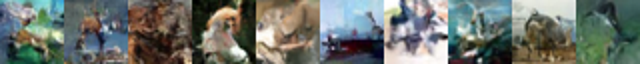

Generation of 10 new images for temperature=0.9


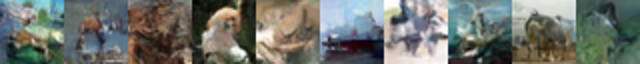

Generation of 10 new images for temperature=0.8


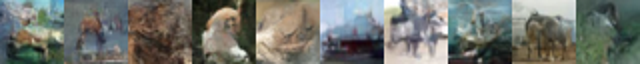

Generation of 10 new images for temperature=0.7


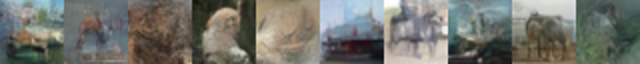

In [20]:
n_samples = 10
temperatures = [1.0, 0.9, 0.8, 0.7]

rng = jax.random.PRNGKey(42)

for t in temperatures:
    output = exp.vdvae.apply(
        variables=ema_params, sample_rng=rng, num_samples_to_generate=n_samples, inputs=None, temperature=t
    )
    # print("="*25)
    print(f"Generation of {n_samples} new images for temperature={t}")
    # print("="*25)
    samples = generate_image_grids(output.samples, nrow=1, ncol=n_samples)
    display(samples.resize((samples.width * 2, samples.height * 2)))

### Reconstructions with different resolutions

We sample latent variables from the approximate posterior until the
given resolution, and sample the rest from the prior at low temperature. This shows what images are likely given a subset of latent variables. For more details, see the [paper](https://arxiv.org/abs/2011.10650) (Figure 4). 

##### First, we construct the model class for this experiment. 

In [21]:
from typing import Mapping

import chex
from flax import linen as nn
import ml_collections
from vdvae_flax import encoder, decoder, vdvae_utils


def decoder_recon_until_resolution(
    decoder: decoder.Decoder,
    resolution: int,
    sample_rng: chex.Array,
    encoder_outputs: Mapping[int, chex.Array] = None,
    recon_temp: float = 1.0,
    sample_temp: float = 0.1,
):
    batch_size = encoder_outputs[decoder.input_resolution].shape[0]

    inputs = jnp.zeros((batch_size,) + (decoder.input_resolution, decoder.input_resolution, decoder.num_channels))
    for block_index, block in enumerate(decoder._blocks):
        sample_rng, sample_rng_now = jax.random.split(sample_rng)
        res = inputs.shape[1]
        temp = recon_temp if res <= resolution else sample_temp
        enc_out = encoder_outputs if res <= resolution else None
        block_output = block(inputs, sample_rng_now, encoder_outputs=enc_out, temperature=temp)
        inputs = block_output.outputs

    return inputs


class VdvaeReconUntilRes(nn.Module):

    config: ml_collections.ConfigDict

    @nn.compact
    def __call__(
        self,
        resolution: int,
        sample_rng: chex.PRNGKey,
        inputs: chex.Array,
        recon_temp: float = 1.0,
        sample_temp: float = 0.1,
    ):
        encoder_model = encoder.Encoder(**self.config.encoder)
        decoder_model = decoder.Decoder(**self.config.decoder)
        sampler_model = vdvae_utils.QuantizedLogisticMixtureNetwork(**self.config.sampler)

        preprocessed_inputs = vdvae_utils.cast_to_float_center_and_normalize(inputs)
        encoder_outputs = encoder_model(preprocessed_inputs)

        sample_rng, sample_rng_now = jax.random.split(sample_rng)
        decoder_outputs = decoder_recon_until_resolution(
            decoder_model, resolution=resolution, sample_rng=sample_rng_now, encoder_outputs=encoder_outputs
        )

        sample_rng, sample_rng_now = jax.random.split(sample_rng)
        sampler_output = sampler_model(sample_rng_now, decoder_outputs, inputs)

        return sampler_output.samples

##### Then we generate samples.

Get some samples from the test set 

10 samples in the test set


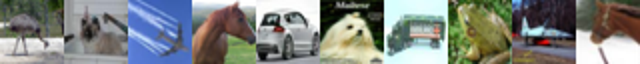

In [22]:
vdvae_recon = VdvaeReconUntilRes(config)

n_samples = 10
resolutions = [32, 16, 8, 4, 1]
rng = jax.random.PRNGKey(0)
inputs = jnp.array(next(iter(exp._eval_ds))).reshape((-1, 32, 32, 3))[:n_samples]
print("=" * 25)
print(f"{n_samples} samples in the test set")
print("=" * 25)
inputs_display = generate_image_grids(inputs, nrow=1, ncol=n_samples)
display(inputs_display.resize((inputs_display.width * 2, inputs_display.height * 2)))

We sample the latent from the posterior until certain resolution (defined by `res`) at temperature `1.0`, and sample the rest from the prior at temperature `0.1`.

Reconstrution of 10 samples at resolution 32


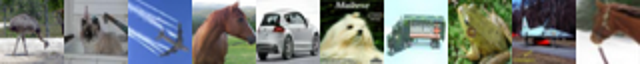

Reconstrution of 10 samples at resolution 16


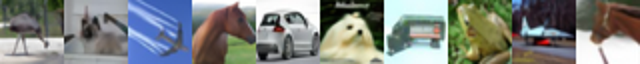

Reconstrution of 10 samples at resolution 8


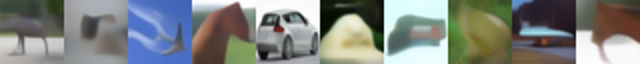

Reconstrution of 10 samples at resolution 4


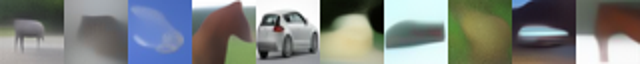

Reconstrution of 10 samples at resolution 1


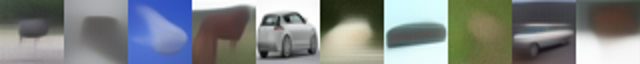

In [23]:
for res in resolutions:
    output = vdvae_recon.apply(variables=ema_params, resolution=res, sample_rng=rng, inputs=inputs)
    print("=" * 25)
    print(f"Reconstrution of {n_samples} samples at resolution {res}")
    print("=" * 25)
    output = generate_image_grids(output, nrow=1, ncol=n_samples)
    display(output.resize((output.width * 2, output.height * 2)))